In [ ]:
pip install open3d

In [ ]:
import matplotlib
import matplotlib.pyplot as plt

from matplotlib import pyplot as plt
from google.colab import drive
drive.mount('/content/drive')
import os
import cv2
import numpy as np
import open3d as o3d
import torch
from PIL import Image
from transformers import GLPNImageProcessor, GLPNForDepthEstimation
from google.colab import output
output.enable_custom_widget_manager()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
feature_extractor = GLPNImageProcessor.from_pretrained("vinvino02/glpn-nyu")
model = GLPNForDepthEstimation.from_pretrained("vinvino02/glpn-nyu")

In [ ]:
def visualizer(videoPath):
  frames = readVideoFileAsImageSequence(videoPath)
  print('You have',frames.shape[2],'frames in your video')

  number = input('Which frame will you like to visualize:')
  pcd=visualize_3d(frames, int(number))
  o3d.visualization.draw_plotly([pcd])
  print('Done')


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

You have 7 frames in your video
Which frame will you like to visualize:4


Done


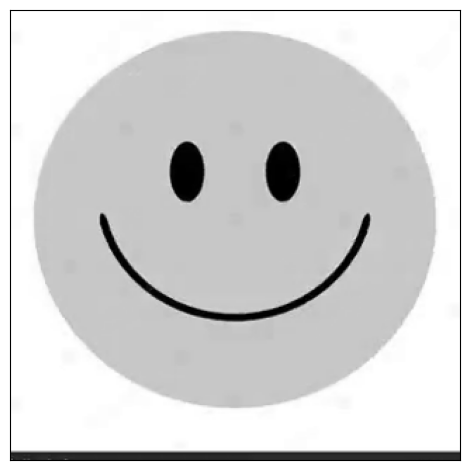

In [ ]:
#Example
visualizer('/content/drive/My Drive/out.mp4')

In [ ]:


'''
@func readVideoFileAsImageSequence
@brief Reads a video file and returns a numpy array of the frames
'''
def readVideoFileAsImageSequence(videoPath, startFrame=0, endFrame=None, grayScale=True):
    cap = cv2.VideoCapture(videoPath)
    if not cap.isOpened():
        print("Error opening video stream or file")
        return None
    if endFrame == None: #if endFrame is not specified, read until the end of the video
        endFrame = int(cap.get(cv2.CAP_PROP_FRAME_COUNT)) #get the number of frames in the video
    startFrame = int(startFrame)

    if grayScale: #if grayscale, only allocate space for one channel
        frames = np.zeros((int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)), int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), endFrame-startFrame ), dtype=np.uint8)
    else: #if color, allocate space for three channels
        frames = np.zeros((int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)), int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), 3, endFrame-startFrame), dtype=np.uint8)

    for i in range(startFrame, endFrame): # iterate over the number of frames
        ret, frame = cap.read() #read the next frame
        if ret: #if the frame was read successfully
            if grayScale: #if grayscale, convert the frame to grayscale
                frames[:,:,i-startFrame] = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            else: #if color, just copy the frame
                frames[:,:,:,i-startFrame] = frame
        else:
            break
    cap.release() #release the video capture object

    return frames

def readTensorFromNpyFile(filename):
    try:
        return np.load(filename, allow_pickle=True)
    except:
        print("Error reading file: " + filename)
        return None

In [ ]:
def visualize_3d(frames, number):

  new_height = 480 if frames[:,:,number].shape[0] > 480 else frames[:,:,number].shape[0]
  new_height -= (new_height % 32)
  new_width = int(new_height*frames[:,:,number].shape[1]/frames[:,:,number].shape[0])
  diff = new_width % 32
  new_width -= diff if diff<16 else new_width + 32 - diff
  new_size = (new_width, new_height)
  image = frames[:,:,number]
  image = Image.fromarray(image)
  image = image.convert('RGB')
  image = image.resize(new_size)
  inputs = feature_extractor(images=image, return_tensors="pt")
  with torch.no_grad():
      outputs = model(**inputs)
      predicted_depth = outputs.predicted_depth
  pad = 16
  output = predicted_depth.squeeze().cpu().numpy()*1000.0
  output = output[pad:-pad, pad:-pad]
  image = image.crop((pad,pad,image.width-pad,image.height-pad))
  fig,ax = plt.subplots(1,1)
  ax.imshow(image)
  ax.tick_params(left = False, bottom = False, labelleft = False, labelbottom = False)
  plt.tight_layout()

  width = image.size[1]
  height = image.size[0]
  depth_image = (output*255/np.max(output)).astype('uint8')
  image = np.array(image)
  #depth_image = np.ascontiguousarray(depth_image)
  depth_o3d = o3d.geometry.Image(depth_image)
  image_o3d = o3d.geometry.Image(image)
  rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(image_o3d, depth_o3d,convert_rgb_to_intensity=False)
  camera_intrinsic = o3d.camera.PinholeCameraIntrinsic()
  camera_intrinsic.set_intrinsics(width, height, 600, 600, width/2, height/2)
  pcd = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd_image, camera_intrinsic)
  #o3d.visualization.draw_plotly([pcd])
  return pcd

In [ ]:
#image = frames[:,:,1]
#image = Image.fromarray(image)


(360, 360)


In [ ]:
#frames = readVideoFileAsImageSequence('/content/drive/My Drive/out.mp4')

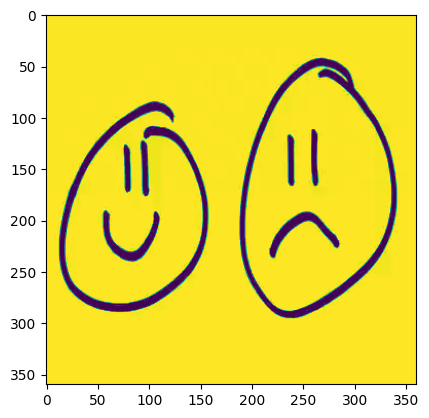

In [ ]:
#plt.imshow(frames[:,:,6])